# Introduction

Healthcare is one of the extremely important services of a nation to keep their population healthy and working for the economy to boom. Lack of healthcare or the collapse of healthcare can lead to massive implications for a country's development. This is the reason as to why every goverment of every country spends billions of dollars to improve and keep their healthcare functioning so as to give the general population affordable healthcare options.

However, challenges faced by a country such as India are far more complicated than the rest of the world. A country with 1.33 billion people with sizeable population living in the remote areas make it a very tough task for everyone to be provided with equal and afforable healthcare oppoptunities. Many poor people need to travel thousands of KMs to get the required healthcare. Another issue faced by healthcares due to the increasing population is the lack of beds and healthcare personnel. This has been especially observed during the tough times of COVID-19 where people with even mild symptoms would flock in big numbers at the goverment healthcare facilities making it extremely tough for the officials to manage the patients.

Innovative methods must be sought after so that the officials can be able to forecast the traffic of patients. Judging the health problems, we can come up with a ML algorithm that can predict how long would a patient require hospitalisation. If the algorithm can help the officials get a ballpark value of hospitalisation period, they'll be able to handle the traffic of patients much better.

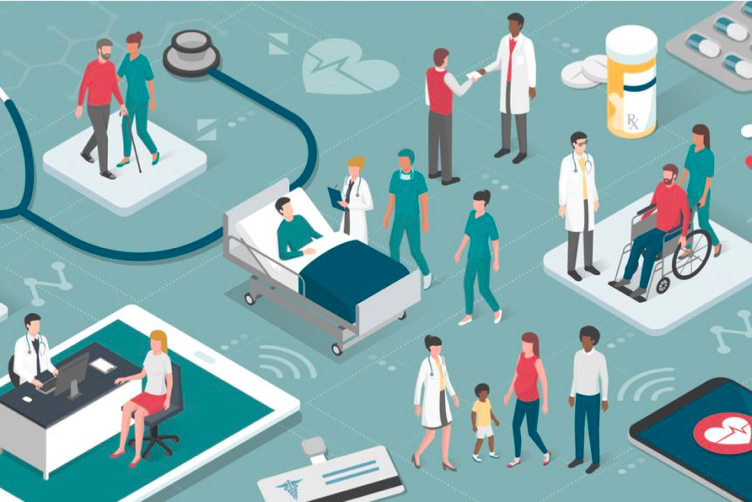

# 1. Importing datasets and relevant libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
plotly.offline.init_notebook_mode (connected = True)

In [2]:
df=pd.read_csv('healthcare/train_data.csv')
df['Count']=1
df.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay,Count
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10,1
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50,1
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40,1
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50,1
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50,1


As we can see, we have numerous columns showing information such as hospital code, hospital type code and many other such identifiers. While a detailed documentation is not available as to what these codes mean, we will preserve them as they could provide great insight for our machine learning.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318438 entries, 0 to 318437
Data columns (total 19 columns):
case_id                              318438 non-null int64
Hospital_code                        318438 non-null int64
Hospital_type_code                   318438 non-null object
City_Code_Hospital                   318438 non-null int64
Hospital_region_code                 318438 non-null object
Available Extra Rooms in Hospital    318438 non-null int64
Department                           318438 non-null object
Ward_Type                            318438 non-null object
Ward_Facility_Code                   318438 non-null object
Bed Grade                            318325 non-null float64
patientid                            318438 non-null int64
City_Code_Patient                    313906 non-null float64
Type of Admission                    318438 non-null object
Severity of Illness                  318438 non-null object
Visitors with Patient                318438 non-null

## Heatmap for missing values

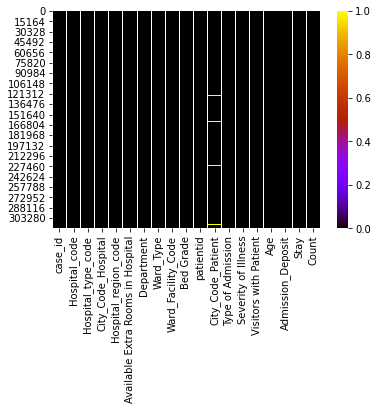

In [4]:
sns.heatmap(df.isna(),cmap='gnuplot')

In [5]:
df.isna().any()

case_id                              False
Hospital_code                        False
Hospital_type_code                   False
City_Code_Hospital                   False
Hospital_region_code                 False
Available Extra Rooms in Hospital    False
Department                           False
Ward_Type                            False
Ward_Facility_Code                   False
Bed Grade                             True
patientid                            False
City_Code_Patient                     True
Type of Admission                    False
Severity of Illness                  False
Visitors with Patient                False
Age                                  False
Admission_Deposit                    False
Stay                                 False
Count                                False
dtype: bool

As we can see, most of columns don't have any missing values associated to them. This is a very good sign that we are dealing with pre processed data.

# 2. Data Visualisations

Here, we shall emphasise on the EDA with the available data to find out some key insights.

## Hospital type code

Let us check which code of hospitals have the highest patient density.

In [6]:
df_hos_code=df.groupby('Hospital_type_code')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)

In [7]:
fig1=px.bar(df_hos_code,x='Hospital_type_code',y='Count',color='Count',labels={'Hospital_type_code':'Hospital Type Code','Count':'Number of patients'})
fig1.update_layout(title='Patient distribution per hospital type code',title_x=0.5,template='plotly_dark')
fig1.show()

As we can see, the hospital type **A** has a much higher patient case load when in comparison any of the other hospital codes. Hospital type **G** has the least case load. Hence, hospital type A has a much higher likelihood of running out of patient beds while G has the least. The ideal distribution would've been a uniform distribution where the under utilised beds of other hospital type codes may have been equally utilised.

## Hospital region code

The region code would likely divide all the available hospitals into three regions encoded as X,Y and Z. This will again let us know which hospital type belongs to which region and their corresponding case loads as well.

In [8]:
fig2=px.sunburst(df,path=['Hospital_region_code','Hospital_type_code'])
fig2.update_layout(title='Hospital region case load distribution',title_x=0.5)
fig2.show()

As we can see from the above sunburst plot, the case loads in hospital region **X** is marginally higher than hospital region **Y** and the least in region **Z** .  For region X, the hospital type A had highest case load while it was more equally balanced between a and b in region Y. For region Z, highest case loads were in hospital type C. Hospitals in region X seem to show better distribution amogst all the hospital types.

For region Y, distribution between A and B is ideal but f,d and g have been under utilised. For Z, cases in hospital c were easily the highest but a and d are extremely under utilised.

## Available Extra Rooms in Hospital

This is an important indicator as to how the hospital is coping with the case loads. Let us check how the extra rooms are distributed across the various hospitals.

In [9]:

fig3=px.histogram(df,x='Available Extra Rooms in Hospital',marginal='box',color_discrete_sequence=['orange'],opacity=0.7)
fig3.update_layout(template='plotly_dark',title='Number of hospitals with extra rooms',title_x=0.5)
fig3.show()

As we can see from the above histogram, majority of hospitals have extra rooms in the size of 2,3 or 4 rooms. The median extra rooms is 3.


## Available rooms Vs Region code

Let us check which region of X,Y and Z have most number of extra rooms available to them. Ideally, they should have a uniform distribution showing equal case loads. Let us check what the data says.

In [10]:
df_beds=df[['Hospital_code','Available Extra Rooms in Hospital','Hospital_region_code']]
df_beds['Hospital_region_code']=df_beds['Hospital_region_code'].map({'X':1,'Y':2,'Z':3})
df_beds_grouped=df_beds.groupby('Hospital_code')[['Available Extra Rooms in Hospital','Hospital_region_code']].median().reset_index()


/Users/rinbaruah/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [11]:
df_beds_grouped['Hospital_region_code']=df_beds_grouped['Hospital_region_code'].map({1:'X',2:'Y',3:'Z'})
df_beds_grouped.head()

,Hospital_code,Available Extra Rooms in Hospital,Hospital_region_code
0,1,3,Y
1,2,2,Z
2,3,3,Z
3,4,3,X
4,5,3,X


In [12]:
df_beds_1=df_beds_grouped.groupby('Hospital_region_code')['Available Extra Rooms in Hospital'].sum().reset_index()
fig4=px.pie(df_beds_1,values='Available Extra Rooms in Hospital',names='Hospital_region_code',hole=0.4)
fig4.update_layout(title='Number of extra rooms in each region code',title_x=0.5)
fig4.update_traces(textinfo='percent+label')

From the above pie chart, we see that the number of extra available rooms are almost equally distributed amongst the three region codes. This is an ideal scenario.

## Department

Here, we shall check which departments have the highest number of case loads.


In [13]:
df_dept=df.groupby('Department')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)


In [14]:
fig5=px.bar(df_dept,x='Department',y='Count',color='Department',labels={'Count':'Number of patients'})
fig5.update_layout(title='Case load distribution per department',title_x=0.5,template='plotly_dark')
fig5.show()

From the above bar plot, we see that majority of the patients register themselves at the gynecology department. Surgery department has the least number of case loads. This is expected as daily birth cases are far higher than daily surgeries.


## Severity of illness

Let us check the number of patients of each severity of illness.

In [15]:
df_sev=df.groupby('Severity of Illness')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)
fig6=px.funnel(df_sev,x='Count',y='Severity of Illness',labels={'Count':'Number of patients'},color='Count')
fig6.update_layout(title='Case load depending upon severity of illness',title_x=0.5,template='plotly_dark')
fig6.show()

From the above funnel plot, we see that most numner of cases are moderate in nature followed by minor and then, extreme.


## Age Vs Severity of illness

Let us check if there's any relation amongst age and severity of illness

In [16]:
fig7=px.sunburst(df,path=['Age','Severity of Illness'])
fig7.update_layout(title='Age (in years) and Severity of Illness',title_x=0.5)
fig7.show()

As we can see from the sunburst plot above, extreme cases are least for each age group. However, the extreme cases in relation to the moderate and minor cases seem to increase with higher age groups.


## Severity of illness Vs Stay

Let us check how the severity of illness and stay period changes.


In [17]:
fig8=px.sunburst(df,path=['Stay','Severity of Illness'])
fig8.update_layout(title='Stay period (in days) vs Severity of illness',title_x=0.5)
fig8.show()

From the above plot, it is seen that generally for lower stay duration(upto 20 days), the severity of illness is majorly minor or moderate. For higher stay duration, the extreme severity cases start rising.

21-30 days and 11-20 days are the most common stay periods across the hospitals.


# 3. Data wrangling

As we can see, we have a lot of data available to us. Some of these data provide us useful information while the other portion doesn't. A portion of the data is not numerical and for this purpose, we will have to wrangle with the data to either label encode or one hot encode them. 

In [18]:
df.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay,Count
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10,1
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50,1
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40,1
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50,1
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50,1


In [19]:
df['Hospital_type_code'].unique()

array(['c', 'e', 'b', 'a', 'f', 'd', 'g'], dtype=object)

In [20]:
from sklearn.preprocessing import LabelEncoder

In [21]:
le=LabelEncoder()
df['Hospital_type_code_cat']=le.fit_transform(df['Hospital_type_code'])

In [22]:
df_reg_codes=pd.get_dummies(df['Hospital_region_code'])

df=pd.merge(df,df_reg_codes,on=df.index)

In [23]:
df.drop('key_0',axis=1,inplace=True)

In [24]:
df_dept=pd.get_dummies(df['Department'])
df=pd.merge(df,df_dept,on=df.index)
df.drop('key_0',axis=1,inplace=True)

In [25]:
df['Ward_Type_cat']=le.fit_transform(df['Ward_Type'])
df['Ward_Facility_Code_cat']=le.fit_transform(df['Ward_Facility_Code'])

In [26]:
df_adm=pd.get_dummies(df['Type of Admission'])
df=pd.merge(df,df_adm,on=df.index)
df.drop('key_0',axis=1,inplace=True)
df_sev_ill=pd.get_dummies(df['Severity of Illness'])
df=pd.merge(df,df_sev_ill,on=df.index)
df.drop('key_0',axis=1,inplace=True)

In [27]:
df['Age_cat']=le.fit_transform(df['Age'])
df['Stay_cat']=le.fit_transform(df['Stay'])

Now that we've either label encoded or one-hot encoded all the data, let us remove the previous categorical columns from the dataframe.

In [28]:
df_train=df.copy()

In [29]:
unn_cols=['case_id','Hospital_type_code','Hospital_region_code','Department','Ward_Type',
          'Ward_Facility_Code','Type of Admission','Severity of Illness','Age','Stay',
          'Count','Admission_Deposit','Bed Grade','City_Code_Patient']

for cols in unn_cols:
    df_train.drop(cols,axis=1,inplace=True)

In [30]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 318438 entries, 0 to 318437
Data columns (total 24 columns):
Hospital_code                        318438 non-null int64
City_Code_Hospital                   318438 non-null int64
Available Extra Rooms in Hospital    318438 non-null int64
patientid                            318438 non-null int64
Visitors with Patient                318438 non-null int64
Hospital_type_code_cat               318438 non-null int64
X                                    318438 non-null uint8
Y                                    318438 non-null uint8
Z                                    318438 non-null uint8
TB & Chest disease                   318438 non-null uint8
anesthesia                           318438 non-null uint8
gynecology                           318438 non-null uint8
radiotherapy                         318438 non-null uint8
surgery                              318438 non-null uint8
Ward_Type_cat                        318438 non-null int64
Ward

As we can see, all the available data is now in numerical form and hence, can be used for ML algorithms. Let us check the correlation of each feature with each other through a heatmap.

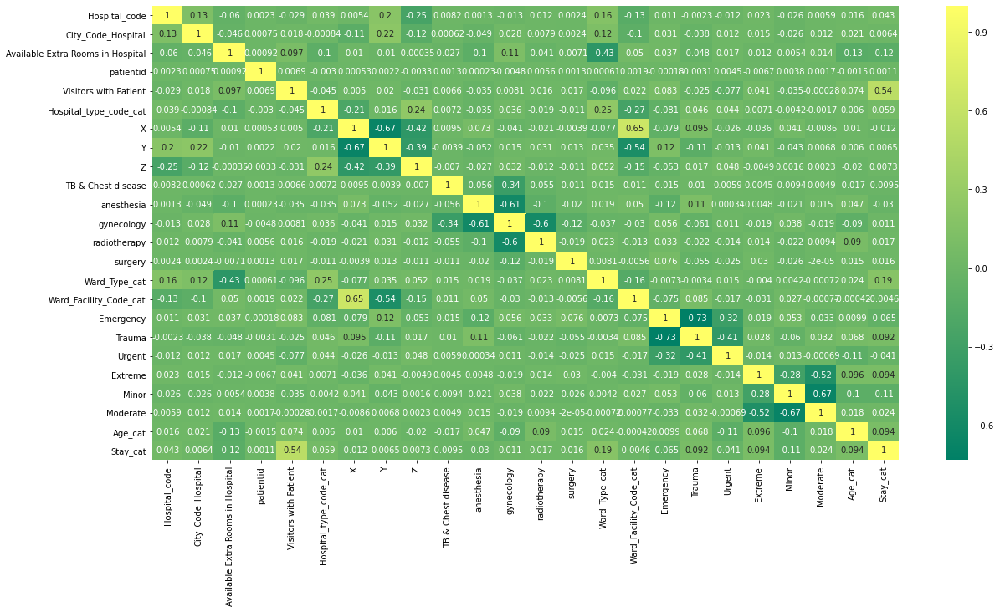

In [31]:
correlations=df_train.corr()
plt.figure(figsize=(20,10))
sns.heatmap(correlations,cmap='summer',annot=True,fmt='.2g')

# 4. Machine Learning


In this section, we shall apply some of the ML algorithms for correct classfication.

## Training phase

## a) Logistic Regression

In [32]:
target=df_train['Stay_cat']
train_df=df_train.iloc[:,:-1]

In [33]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
reg_log=LogisticRegression()

In [34]:
X_train,X_test,y_train,y_test=train_test_split(train_df,target,test_size=0.3,shuffle=True,random_state=0)


In [35]:
reg_log.fit(X_train,y_train)

/Users/rinbaruah/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

/Users/rinbaruah/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning:

Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.



LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [36]:
reg_log.score(X_train,y_train)

0.27974123621616287

In [37]:
y_predict_log=reg_log.predict(X_test)
reg_log.score(X_test,y_test)

0.2801155633714357

As we can see, the logistic regression has performed extremely poorly with only 28 % accuracy. Let us check another algorithm.


## b) Random Forest Classifier

In [38]:
from sklearn.ensemble import RandomForestClassifier

In [39]:
rfc=RandomForestClassifier(max_depth=10,random_state=0)

In [40]:
rfc.fit(X_train,y_train)
rfc.score(X_train,y_train)

/Users/rinbaruah/opt/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



0.40493302109409346

In [41]:
y_preds_rfc=rfc.predict(X_test)
rfc.score(X_test,y_test)

0.38925176904074027

We can see that the scores for Random Forest Classifier are better than logistic regression for a pre pruned max_depth of 10.


## c) CatBoost



In [42]:
from catboost import CatBoostClassifier

In [55]:
cb_clf=CatBoostClassifier(iterations=800,
                           learning_rate=0.08,
                           depth=8,
                           loss_function='MultiClass',
                           eval_metric='Accuracy')

In [44]:
cb_clf.fit(X_train,y_train)
cb_clf.score(X_train,y_train)

0:	learn: 0.3646963	total: 224ms	remaining: 2m 59s
1:	learn: 0.3760913	total: 391ms	remaining: 2m 36s
2:	learn: 0.3762124	total: 575ms	remaining: 2m 32s
3:	learn: 0.3789490	total: 847ms	remaining: 2m 48s
4:	learn: 0.3804249	total: 1.13s	remaining: 2m 59s
5:	learn: 0.3816138	total: 1.45s	remaining: 3m 11s
6:	learn: 0.3816497	total: 1.74s	remaining: 3m 16s
7:	learn: 0.3828520	total: 1.98s	remaining: 3m 15s
8:	learn: 0.3829955	total: 2.16s	remaining: 3m 10s
9:	learn: 0.3828834	total: 2.36s	remaining: 3m 6s
10:	learn: 0.3835428	total: 2.54s	remaining: 3m 2s
11:	learn: 0.3841933	total: 2.75s	remaining: 3m
12:	learn: 0.3844894	total: 3s	remaining: 3m 1s
13:	learn: 0.3851040	total: 3.17s	remaining: 2m 58s
14:	learn: 0.3862256	total: 3.36s	remaining: 2m 55s
15:	learn: 0.3873606	total: 3.52s	remaining: 2m 52s
16:	learn: 0.3882803	total: 3.71s	remaining: 2m 50s
17:	learn: 0.3887154	total: 3.88s	remaining: 2m 48s
18:	learn: 0.3897831	total: 4.06s	remaining: 2m 46s
19:	learn: 0.3899985	total: 4.23

159:	learn: 0.4107696	total: 32.8s	remaining: 2m 11s
160:	learn: 0.4107471	total: 33s	remaining: 2m 11s
161:	learn: 0.4109490	total: 33.2s	remaining: 2m 10s
162:	learn: 0.4111419	total: 33.4s	remaining: 2m 10s
163:	learn: 0.4113259	total: 33.7s	remaining: 2m 10s
164:	learn: 0.4114021	total: 33.9s	remaining: 2m 10s
165:	learn: 0.4114874	total: 34.1s	remaining: 2m 10s
166:	learn: 0.4114560	total: 34.3s	remaining: 2m 9s
167:	learn: 0.4115995	total: 34.5s	remaining: 2m 9s
168:	learn: 0.4117117	total: 34.7s	remaining: 2m 9s
169:	learn: 0.4118552	total: 35s	remaining: 2m 9s
170:	learn: 0.4120840	total: 35.2s	remaining: 2m 9s
171:	learn: 0.4120840	total: 35.3s	remaining: 2m 9s
172:	learn: 0.4122186	total: 35.5s	remaining: 2m 8s
173:	learn: 0.4125282	total: 35.7s	remaining: 2m 8s
174:	learn: 0.4125910	total: 35.9s	remaining: 2m 8s
175:	learn: 0.4125640	total: 36.1s	remaining: 2m 7s
176:	learn: 0.4127076	total: 36.3s	remaining: 2m 7s
177:	learn: 0.4128377	total: 36.5s	remaining: 2m 7s
178:	lear

316:	learn: 0.4253004	total: 1m 1s	remaining: 1m 34s
317:	learn: 0.4253452	total: 1m 2s	remaining: 1m 34s
318:	learn: 0.4254529	total: 1m 2s	remaining: 1m 33s
319:	learn: 0.4255067	total: 1m 2s	remaining: 1m 33s
320:	learn: 0.4255650	total: 1m 2s	remaining: 1m 33s
321:	learn: 0.4256817	total: 1m 2s	remaining: 1m 33s
322:	learn: 0.4257804	total: 1m 2s	remaining: 1m 32s
323:	learn: 0.4258432	total: 1m 3s	remaining: 1m 32s
324:	learn: 0.4261124	total: 1m 3s	remaining: 1m 32s
325:	learn: 0.4261034	total: 1m 3s	remaining: 1m 32s
326:	learn: 0.4263367	total: 1m 3s	remaining: 1m 32s
327:	learn: 0.4263546	total: 1m 3s	remaining: 1m 31s
328:	learn: 0.4264892	total: 1m 3s	remaining: 1m 31s
329:	learn: 0.4265565	total: 1m 4s	remaining: 1m 31s
330:	learn: 0.4266193	total: 1m 4s	remaining: 1m 31s
331:	learn: 0.4267987	total: 1m 4s	remaining: 1m 30s
332:	learn: 0.4267629	total: 1m 4s	remaining: 1m 30s
333:	learn: 0.4268840	total: 1m 4s	remaining: 1m 30s
334:	learn: 0.4270320	total: 1m 4s	remaining: 

470:	learn: 0.4385750	total: 1m 28s	remaining: 1m 1s
471:	learn: 0.4386199	total: 1m 28s	remaining: 1m 1s
472:	learn: 0.4386961	total: 1m 28s	remaining: 1m 1s
473:	learn: 0.4387634	total: 1m 28s	remaining: 1m
474:	learn: 0.4388083	total: 1m 28s	remaining: 1m
475:	learn: 0.4388890	total: 1m 28s	remaining: 1m
476:	learn: 0.4389204	total: 1m 29s	remaining: 1m
477:	learn: 0.4389384	total: 1m 29s	remaining: 1m
478:	learn: 0.4392479	total: 1m 29s	remaining: 59.9s
479:	learn: 0.4393152	total: 1m 29s	remaining: 59.8s
480:	learn: 0.4392390	total: 1m 29s	remaining: 59.6s
481:	learn: 0.4393780	total: 1m 29s	remaining: 59.4s
482:	learn: 0.4395261	total: 1m 30s	remaining: 59.2s
483:	learn: 0.4395440	total: 1m 30s	remaining: 59s
484:	learn: 0.4396293	total: 1m 30s	remaining: 58.8s
485:	learn: 0.4396517	total: 1m 30s	remaining: 58.6s
486:	learn: 0.4397459	total: 1m 30s	remaining: 58.4s
487:	learn: 0.4398446	total: 1m 30s	remaining: 58.2s
488:	learn: 0.4399657	total: 1m 31s	remaining: 58s
489:	learn: 

626:	learn: 0.4504275	total: 1m 54s	remaining: 31.6s
627:	learn: 0.4505128	total: 1m 54s	remaining: 31.4s
628:	learn: 0.4505173	total: 1m 54s	remaining: 31.3s
629:	learn: 0.4505890	total: 1m 55s	remaining: 31.1s
630:	learn: 0.4507505	total: 1m 55s	remaining: 30.9s
631:	learn: 0.4507954	total: 1m 55s	remaining: 30.7s
632:	learn: 0.4508178	total: 1m 55s	remaining: 30.5s
633:	learn: 0.4508717	total: 1m 55s	remaining: 30.3s
634:	learn: 0.4508896	total: 1m 56s	remaining: 30.1s
635:	learn: 0.4510018	total: 1m 56s	remaining: 30s
636:	learn: 0.4511453	total: 1m 56s	remaining: 29.8s
637:	learn: 0.4511767	total: 1m 56s	remaining: 29.6s
638:	learn: 0.4512216	total: 1m 56s	remaining: 29.4s
639:	learn: 0.4513786	total: 1m 56s	remaining: 29.2s
640:	learn: 0.4515805	total: 1m 57s	remaining: 29s
641:	learn: 0.4516523	total: 1m 57s	remaining: 28.9s
642:	learn: 0.4516612	total: 1m 57s	remaining: 28.7s
643:	learn: 0.4516209	total: 1m 57s	remaining: 28.5s
644:	learn: 0.4517779	total: 1m 57s	remaining: 28.

784:	learn: 0.4623384	total: 2m 21s	remaining: 2.71s
785:	learn: 0.4623429	total: 2m 21s	remaining: 2.52s
786:	learn: 0.4624281	total: 2m 21s	remaining: 2.34s
787:	learn: 0.4625178	total: 2m 22s	remaining: 2.16s
788:	learn: 0.4625178	total: 2m 22s	remaining: 1.98s
789:	learn: 0.4625717	total: 2m 22s	remaining: 1.8s
790:	learn: 0.4627107	total: 2m 22s	remaining: 1.62s
791:	learn: 0.4627242	total: 2m 22s	remaining: 1.44s
792:	learn: 0.4627197	total: 2m 22s	remaining: 1.26s
793:	learn: 0.4628588	total: 2m 23s	remaining: 1.08s
794:	learn: 0.4629171	total: 2m 23s	remaining: 901ms
795:	learn: 0.4629126	total: 2m 23s	remaining: 721ms
796:	learn: 0.4630113	total: 2m 23s	remaining: 541ms
797:	learn: 0.4630966	total: 2m 23s	remaining: 360ms
798:	learn: 0.4631908	total: 2m 23s	remaining: 180ms
799:	learn: 0.4631369	total: 2m 24s	remaining: 0us


0.46313692767354847

In [45]:
y_preds_cb=cb_clf.predict(X_test)
cb_clf.score(X_test,y_test)

0.40133149101871624

As we can see, catboost seems to have done well at classifying the results better than the other algorithms. We shall use this for our test dataframe.

## Testing phase

In [46]:
df_test=pd.read_csv('healthcare/test_data.csv')
df_test.head()

id_df=df_test['patientid']

In [47]:
df_test['Hospital_type_code_cat']=le.fit_transform(df_test['Hospital_type_code'])
df_reg_codes=pd.get_dummies(df_test['Hospital_region_code'])
df_test=pd.merge(df_test,df_reg_codes,on=df_test.index)
df_test.drop('key_0',axis=1,inplace=True)
df_dept=pd.get_dummies(df_test['Department'])
df_test=pd.merge(df_test,df_dept,on=df_test.index)
df_test.drop('key_0',axis=1,inplace=True)

df_test['Ward_Type_cat']=le.fit_transform(df_test['Ward_Type'])
df_test['Ward_Facility_Code_cat']=le.fit_transform(df_test['Ward_Facility_Code'])

df_adm=pd.get_dummies(df_test['Type of Admission'])
df_test=pd.merge(df_test,df_adm,on=df_test.index)
df_test.drop('key_0',axis=1,inplace=True)
df_sev_ill=pd.get_dummies(df_test['Severity of Illness'])
df_test=pd.merge(df_test,df_sev_ill,on=df_test.index)
df_test.drop('key_0',axis=1,inplace=True)


df_test['Age_cat']=le.fit_transform(df_test['Age'])


In [48]:
unn_cols=['Hospital_type_code','Hospital_region_code','Department','Ward_Type',
          'Ward_Facility_Code','Type of Admission','Severity of Illness','Age',
          'Admission_Deposit','Bed Grade','City_Code_Patient']

for cols in unn_cols:
    df_test.drop(cols,axis=1,inplace=True)

In [49]:
df_test=df_test[['Hospital_code', 'City_Code_Hospital',
       'Available Extra Rooms in Hospital', 'patientid',
       'Visitors with Patient', 'Hospital_type_code_cat', 'X', 'Y', 'Z',
       'TB & Chest disease', 'anesthesia', 'gynecology', 'radiotherapy',
       'surgery', 'Ward_Type_cat', 'Ward_Facility_Code_cat', 'Emergency',
       'Trauma', 'Urgent', 'Extreme', 'Minor', 'Moderate', 'Age_cat']]

In [50]:
y_preds=cb_clf.predict(df_test)

We now need to convert the numerical stay data into categorical data.

In [56]:
df['Stay_cat']=le.fit_transform(df['Stay'])
y_final=le.inverse_transform(y_preds)

In [63]:
sample_df=pd.read_csv('healthcare/sample_sub.csv')
df_final=pd.DataFrame(sample_df.iloc[:,0],columns=['case_id'])
df_final['Stay']= y_final

In [65]:
final_sub=df_final.to_csv('Catboost predictions',index=False)